<a href="https://colab.research.google.com/github/Jan2309jr/Multiclass-Fish-Image-Classification/blob/main/multiclass_fish_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name - Multiclass Fish Image Classification**

## **Project Summary**

This project aims to classify fish images into multiple categories using deep learning. The workflow involved training both a custom CNN and several transfer learning models — specifically ResNet50, VGG, MobileNet, EfficientNetB0, and InceptionV3 — to evaluate performance across architectures. Model evaluation revealed extremely high accuracy (~99%) on the given dataset, with MobileNet emerging as the best-performing model.

The MobileNet .h5 model was saved and integrated into a Streamlit web application, enabling users to upload fish images and receive real-time category predictions. The app is fully deployed, making the fish classification system accessible through a simple, interactive interface.

Key Achievements :
- Trained 6 models (1 custom CNN + 5 pre-trained transfer learning models).
- Achieved ~99% accuracy on the dataset.
- Saved and reloaded models for later use.
- Built and deployed a Streamlit web app using the best-performing MobileNet model.

## **GitHub Link** - [Click Here](https://github.com/Jan2309jr/Multiclass-Fish-Image-Classification.git)

## **Problem Statement**

### This project focuses on classifying fish images into multiple categories using deep learning models. The task involves training a CNN from scratch and leveraging transfer learning with pre-trained models to enhance performance. The project also includes saving models for later use and deploying a Streamlit application to predict fish categories from user-uploaded images.

## **1. Getting to Know my Dataset**

### Importing Libraried

In [ ]:
import pandas as pd
import numpy as np
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import joblib
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import VGG16, ResNet50, MobileNet, InceptionV3, EfficientNetB0
from tensorflow.keras.optimizers import Adam
import warnings

2025-08-04 12:12:37.049150: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754309557.250364      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754309557.322254      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Loading the Dataset

In [ ]:
!wget -q https://github.com/Jan2309jr/Multiclass-Fish-Image-Classification/archive/e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9.zip
!unzip -o -q e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9.zip

train_df='./Multiclass-Fish-Image-Classification-e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9/data/train'
valid_df='./Multiclass-Fish-Image-Classification-e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9/data/val'
test_df='./Multiclass-Fish-Image-Classification-e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9/data/test'

In [ ]:
def head(datasetName, n):
    for dir_ in os.listdir(datasetName):
        if (os.path.isdir(os.path.join(datasetName,dir_))):
            img=os.listdir(os.path.join(datasetName,dir_))
            plt.figure(figsize=(15,6))
            plt.suptitle(dir_,fontsize=16)
            for i in range(n):
                img_path=os.path.join(datasetName,dir_,img[i])
                image=Image.open(img_path)
                plt.subplot(1,n,i+1)
                plt.imshow(image)
            plt.tight_layout()
            plt.show()

### First View of the Dataset

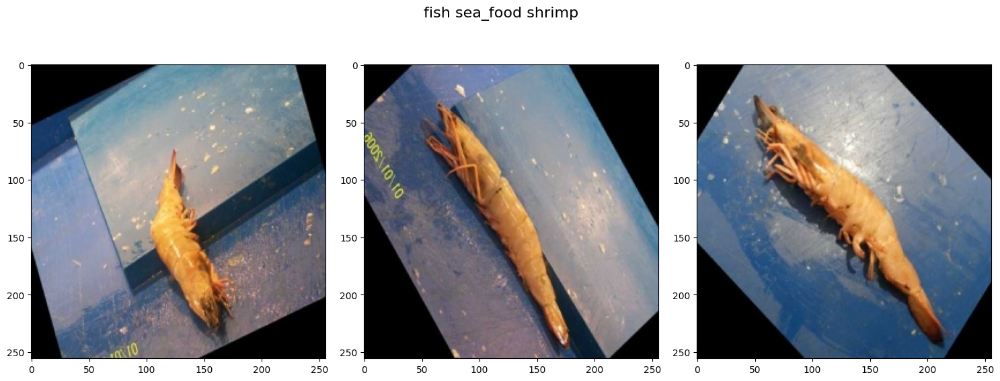

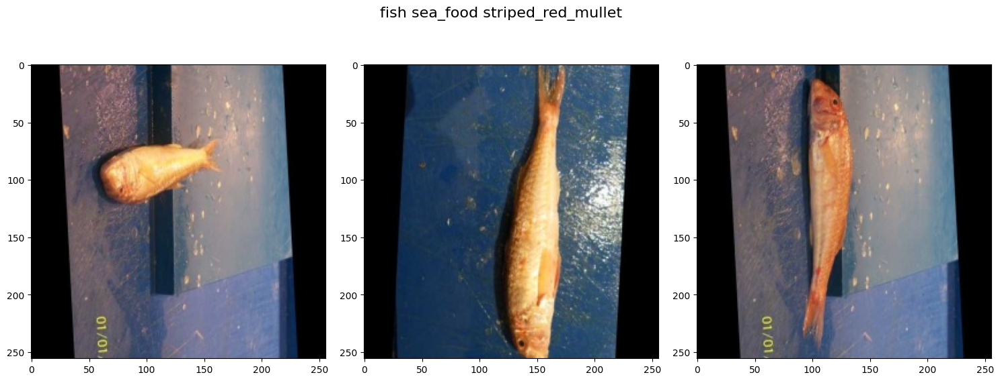

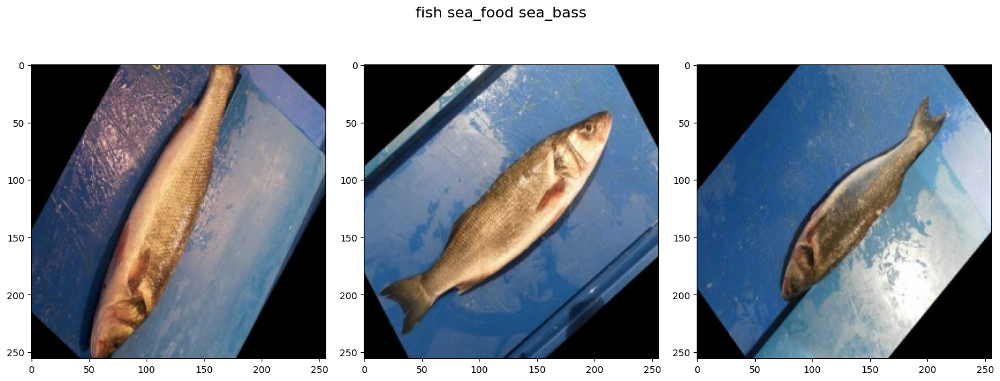

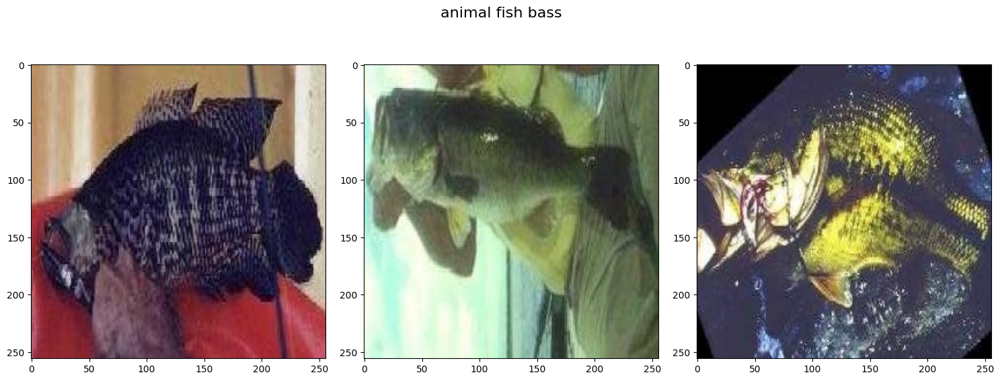

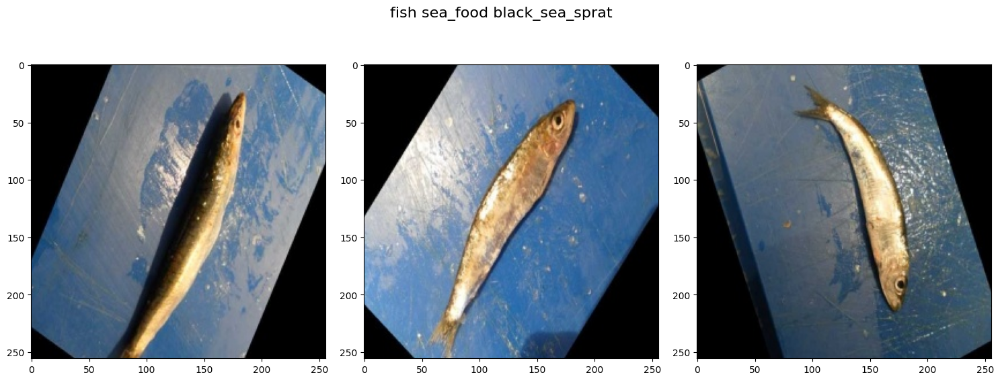

...

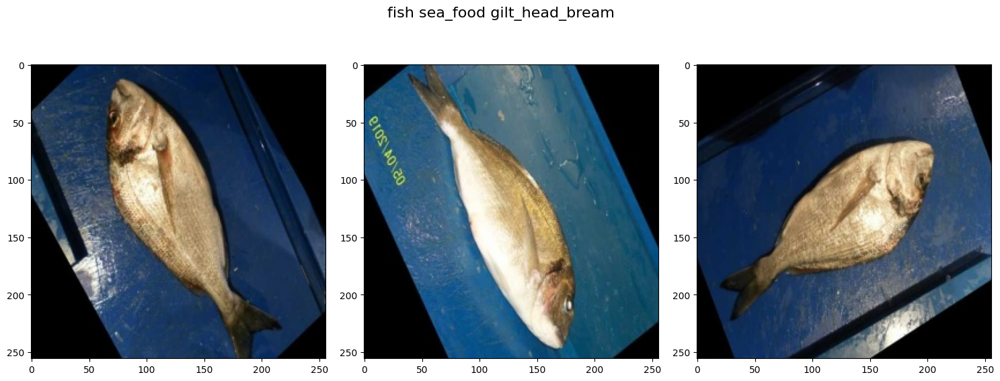

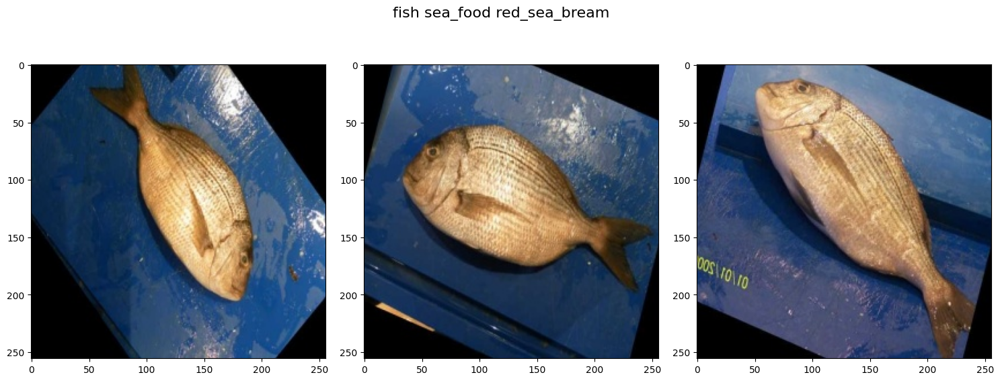

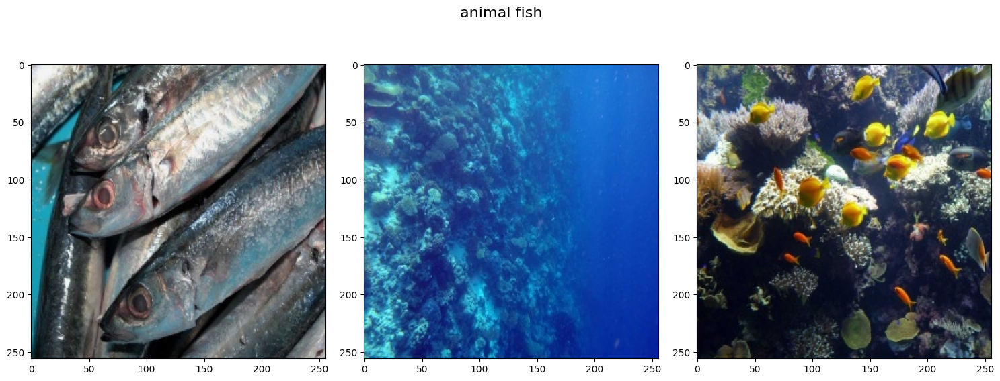

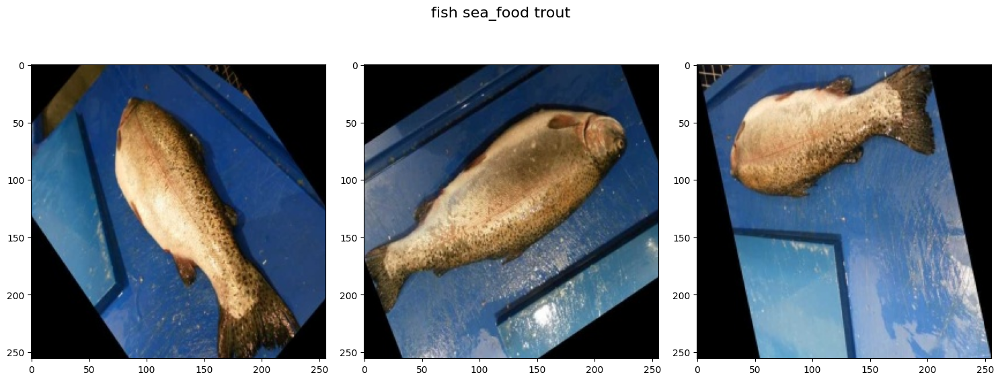

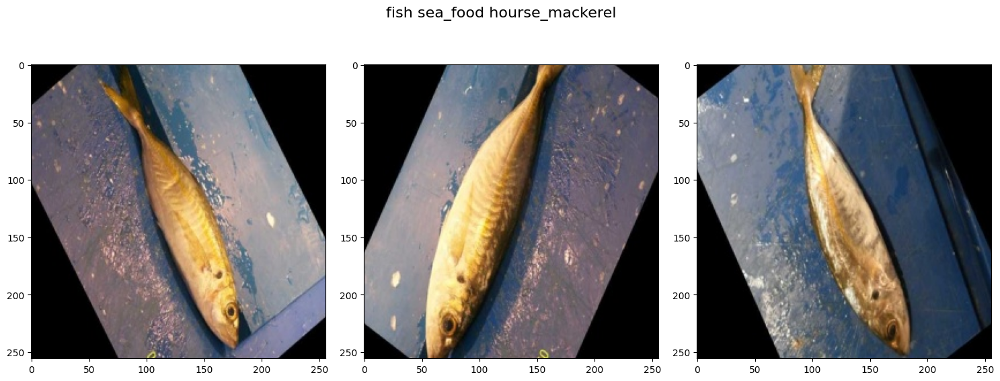

In [ ]:
head(train_df,3)

### Dataset Images Count

In [ ]:
def img_count(datasetName):
    print(f'Count of Images in {datasetName}')
    sum=0
    for i,dir_ in enumerate(os.listdir(datasetName)):
        if (os.path.isdir(os.path.join(datasetName,dir_))):
            count= len(os.listdir(os.path.join(datasetName,dir_)))
            print(f'{i+1}. Count of {dir_} : {count}')
            sum+=count
    print(f'Total images in the Dataset : {sum}')

In [ ]:
img_count(train_df)

Count of Images in ./Multiclass-Fish-Image-Classification-e6e62a2df2d6f3e9bc283717f2fd9fb30c8b69f9/data/train
1. Count of fish sea_food shrimp : 576
2. Count of fish sea_food striped_red_mullet : 547
3. Count of fish sea_food sea_bass : 538
4. Count of animal fish bass : 30
5. Count of fish sea_food black_sea_sprat : 569
6. Count of fish sea_food red_mullet : 579
7. Count of fish sea_food gilt_head_bream : 566
8. Count of fish sea_food red_sea_bream : 571
9. Count of animal fish : 1096
10. Count of fish sea_food trout : 580
11. Count of fish sea_food hourse_mackerel : 573
Total images in the Dataset : 6225


### Observations

* The training dataset consists of 11 fish categories with a total of 6,225 color images.
* Each class represents a specific type of fish or seafood, such as shrimp, trout, red sea bream, and sea bass.
* Class distribution is fairly balanced across most categories, ranging from 538 to 580 images per class, except for the animal fish bass class, which contains only 30 images, indicating a class imbalance.
* The images are not standardized, they are tilted, disoriented, and captured in varying lighting conditions and backgrounds.
* They are color images, and unlike studio datasets, the background isn't plain, which increases the complexity of the classification task.

## **2. Data Preprocessing and Augmentation**

### Resizing the Images and Loading the Dataset

In [ ]:
train_ds = image_dataset_from_directory(
    train_df,
    image_size=(224, 224), #resizing the images
    batch_size=32,
    label_mode='categorical'
)
val_ds = image_dataset_from_directory(
    valid_df,
    image_size=(224, 224), #resizing the images
    batch_size=32,
    label_mode='categorical'
)
test_ds = image_dataset_from_directory(
    test_df,
    image_size=(224, 224), #resizing the images
    batch_size=32,
    label_mode='categorical'
)

Found 6225 files belonging to 11 classes.


I0000 00:00:1754309589.673015      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Found 1092 files belonging to 11 classes.
Found 3187 files belonging to 11 classes.


### Rescaling the images

In [ ]:
normalization_layer = layers.Rescaling(1./255) # Rescale pixel values to [0, 1]

### Data Augmentation

In [ ]:
# Data augmentation layer
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])
# Apply augmentation only to training set
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y)).cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds   = val_ds.map(lambda x, y: (normalization_layer(x), y)).cache().prefetch(buffer_size=AUTOTUNE)
test_ds  = test_ds.map(lambda x, y: (normalization_layer(x), y)).cache().prefetch(buffer_size=AUTOTUNE)

## **3. Model Training**

### **Convolutional Neural Network Model**

#### Defining the CNN model

In [ ]:
def build_cnn_model(input_shape=(224, 224, 3), num_classes=11):
    model = models.Sequential([
        # Convolutional Block 1
        layers.Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2,2)),
        # Convolutional Block 2
        layers.Conv2D(64, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        # Convolutional Block 3
        layers.Conv2D(128, (3,3), activation='relu'),
        layers.MaxPooling2D((2,2)),
        # Fully Connected Layers
        layers.Flatten(),                        # Flatten feature maps
        layers.Dense(128, activation='relu'),    # Dense hidden layer
        layers.Dropout(0.3),                     # Dropout for regularization
        # Output Layer
        layers.Dense(num_classes, activation='softmax')  # Multi-class classification
    ])
    return model

In [ ]:
# Initializing
input_shape = (224, 224, 3)
num_classes = 11
CNN_model = build_cnn_model(input_shape=input_shape, num_classes=num_classes)
CNN_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


#### Adding Early Stops and Model Checkpoints

In [ ]:
early_stop = callbacks.EarlyStopping(patience=5, restore_best_weights=True)
checkpoint = callbacks.ModelCheckpoint('cnn_fish_model.h5', save_best_only=True)

#### Training the model

In [ ]:
cnn_history = CNN_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/30


I0000 00:00:1754309669.286026      70 service.cc:148] XLA service 0x7d12d8004000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1754309669.286870      70 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1754309669.577189      70 cuda_dnn.cc:529] Loaded cuDNN version 90300


  7/195 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.0626 - loss: 3.6630

I0000 00:00:1754309673.655845      70 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


195/195 ━━━━━━━━━━━━━━━━━━━━ 88s 59ms/step - accuracy: 0.3130 - loss: 2.0684 - val_accuracy: 0.6502 - val_loss: 1.1154
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.6337 - loss: 1.0277 - val_accuracy: 0.8507 - val_loss: 0.5262
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.7763 - loss: 0.6428 - val_accuracy: 0.8645 - val_loss: 0.4556
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.8436 - loss: 0.4533 - val_accuracy: 0.8452 - val_loss: 0.4925
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.8899 - loss: 0.3639 - val_accuracy: 0.9258 - val_loss: 0.2729
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.9088 - loss: 0.2678 - val_accuracy: 0.9313 - val_loss: 0.2627
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.9141 - loss: 0.2389 - val_accuracy: 0.9139 - val_loss: 0.2691
Epoch 8/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.9350 - loss: 0.1958 - val_accuracy: 0.91

### Transfer Learning Models

#### Building the Model

In [ ]:
IMG_SIZE = (224, 224)
INPUT_SHAPE = IMG_SIZE + (3,)
NUM_CLASSES = 11
def build_transfer_model(base_model):
    base_model.trainable = False  # freeze pretrained weights
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(NUM_CLASSES, activation='softmax')
    ])
    model.compile(optimizer=Adam(0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

#### Training all the transfer models

In [ ]:
EPOCHS = 30
CHECKPOINT_DIR = "checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
# callbacks
def get_callbacks(model_name):
    return [
        EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
        ModelCheckpoint(
            filepath=os.path.join(CHECKPOINT_DIR, f'{model_name}_best_weights.h5'),
            monitor='val_loss',
            save_best_only=True
        )
    ]
# training
def train_model(model, model_name, train_ds, val_ds, epochs=EPOCHS):
    print(f"\n Training {model_name}...")
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=get_callbacks(model_name)
    )
    return history

#### VGG16

In [ ]:
vgg16_model = build_transfer_model(VGG16(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE))
vgg16_history = train_model(vgg16_model, "vgg16", train_ds, val_ds)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 Training vgg16...
Epoch 1/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 33s 138ms/step - accuracy: 0.1544 - loss: 2.4235 - val_accuracy: 0.3608 - val_loss: 2.0843
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - accuracy: 0.2922 - loss: 2.0711 - val_accuracy: 0.4927 - val_loss: 1.9100
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - accuracy: 0.3747 - loss: 1.8945 - val_accuracy: 0.6273 - val_loss: 1.7782
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - accuracy: 0.4518 - loss: 1.7478 - val_accuracy: 0.6593 - val_loss: 1.6662
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - accuracy: 0.5249 - loss: 1.6449 - val_accuracy: 0.7042 - val_loss: 1.5702
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - accuracy: 0.5790 - loss: 1.5418 - val_accuracy: 0.6749 - val_loss: 1.4708
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - accuracy: 0.6149 - loss: 1.4481 - val_accuracy: 0.7143 - val_loss: 1.3805
Epoch 8/30
195/195

#### ResNet50

In [ ]:
resnet50_model = build_transfer_model(ResNet50(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE))
resnet50_history = train_model(resnet50_model, "resnet50", train_ds, val_ds)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 Training resnet50...
Epoch 1/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 36s 110ms/step - accuracy: 0.1249 - loss: 2.4246 - val_accuracy: 0.1712 - val_loss: 2.2686
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.1727 - loss: 2.2903 - val_accuracy: 0.1712 - val_loss: 2.2415
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.1840 - loss: 2.2545 - val_accuracy: 0.1639 - val_loss: 2.2137
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.1912 - loss: 2.2286 - val_accuracy: 0.1639 - val_loss: 2.1875
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.1966 - loss: 2.2037 - val_accuracy: 0.2500 - val_loss: 2.1605
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.2203 - loss: 2.1724 - val_accuracy: 0.2738 - val_loss: 2.1465
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - accuracy: 0.2219 - loss: 2.1649 - val_accuracy: 0.2143 - val_loss: 2.1249
Epoch 8/30
195/

#### MobileNet

In [ ]:
mobilenet_model = build_transfer_model(MobileNet(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE))
mobilenet_history = train_model(mobilenet_model, "mobilenet", train_ds, val_ds)

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 Training mobilenet...
Epoch 1/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - accuracy: 0.3349 - loss: 2.0378 - val_accuracy: 0.8608 - val_loss: 0.7135
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.7778 - loss: 0.7535 - val_accuracy: 0.9515 - val_loss: 0.3621
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.8790 - loss: 0.4470 - val_accuracy: 0.9725 - val_loss: 0.2318
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.9190 - loss: 0.3073 - val_accuracy: 0.9744 - val_loss: 0.1641
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.9358 - loss: 0.2317 - val_accuracy: 0.9771 - val_loss: 0.1236
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.9526 - loss: 0.1844 - val_accuracy: 0.9844 - val_loss: 0.1024
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.9601 - loss: 0.1479 - val_accuracy: 0.9835 - val_loss: 0.0849
Epoch 8/30
195/195 ━━

#### InceptionV3

In [ ]:
inceptionv3_model = build_transfer_model(InceptionV3(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE))
inceptionv3_history = train_model(inceptionv3_model, "inceptionv3", train_ds, val_ds)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

 Training inceptionv3...
Epoch 1/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 46s 141ms/step - accuracy: 0.3450 - loss: 1.9767 - val_accuracy: 0.8416 - val_loss: 0.6355
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8030 - loss: 0.6728 - val_accuracy: 0.9020 - val_loss: 0.3854
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.8661 - loss: 0.4417 - val_accuracy: 0.9286 - val_loss: 0.2806
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.8861 - loss: 0.3439 - val_accuracy: 0.9396 - val_loss: 0.2413
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9234 - loss: 0.2697 - val_accuracy: 0.9432 - val_loss: 0.2066
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9339 - loss: 0.2412 - val_accuracy: 0.9460 - val_loss: 0.1896
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9460 - loss: 0.1931 - val_accuracy: 0.9542 - val_loss: 0.1620
Epoch 8/30
1

#### EfficientNetB0

In [ ]:
efficientnetb0_model = build_transfer_model(EfficientNetB0(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE))
efficientnetb0_history = train_model(efficientnetb0_model, "efficientnetb0", train_ds, val_ds)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 Training efficientnetb0...
Epoch 1/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - accuracy: 0.1572 - loss: 2.3464 - val_accuracy: 0.1712 - val_loss: 2.3145
Epoch 2/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1643 - loss: 2.3255 - val_accuracy: 0.1712 - val_loss: 2.3105
Epoch 3/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.1728 - loss: 2.3193 - val_accuracy: 0.1712 - val_loss: 2.3125
Epoch 4/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - accuracy: 0.1685 - loss: 2.3125 - val_accuracy: 0.1712 - val_loss: 2.3114
Epoch 5/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.1702 - loss: 2.3161 - val_accuracy: 0.1712 - val_loss: 2.3104
Epoch 6/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - accuracy: 0.1734 - loss: 2.3047 - val_accuracy: 0.1712 - val_loss: 2.3107
Epoch 7/30
195/195 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.1704 - loss: 2.3096 - val_accuracy: 0.1712 - val_loss: 2.3089
Epoch 8/30
195/

#### Fine Tuning the Models

In [ ]:
def fine_tune_model(model, model_name, base_model, train_ds, val_ds, epochs=5):
    print(f"\n Fine-tuning {model_name}...")

    # Unfreeze the top layers of the base model
    base_model.trainable = True

    # Compile again with a low LR
    model.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    # Fine-tune
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=get_callbacks(f"{model_name}_finetuned")
    )
    return history

In [ ]:
# fine tuning all models
vgg16_finetune_history = fine_tune_model(vgg16_model, "vgg16", vgg16_model.layers[0], train_ds, val_ds)
resnet50_finetune_history = fine_tune_model(resnet50_model, "resnet50", resnet50_model.layers[0], train_ds, val_ds)
mobilenet_finetune_history = fine_tune_model(mobilenet_model, "mobilenet", mobilenet_model.layers[0], train_ds, val_ds)
inceptionv3_finetune_history = fine_tune_model(inceptionv3_model, "inceptionv3", inceptionv3_model.layers[0], train_ds, val_ds)
efficientnetb0_finetune_history = fine_tune_model(efficientnetb0_model, "efficientnetb0", efficientnetb0_model.layers[0], train_ds, val_ds)


 Fine-tuning vgg16...
Epoch 1/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 84s 302ms/step - accuracy: 0.9025 - loss: 0.3348 - val_accuracy: 0.9689 - val_loss: 0.1344
Epoch 2/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 46s 235ms/step - accuracy: 0.9775 - loss: 0.0904 - val_accuracy: 0.9725 - val_loss: 0.0938
Epoch 3/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 46s 235ms/step - accuracy: 0.9872 - loss: 0.0475 - val_accuracy: 0.9780 - val_loss: 0.0598
Epoch 4/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 46s 235ms/step - accuracy: 0.9925 - loss: 0.0312 - val_accuracy: 0.9863 - val_loss: 0.0428
Epoch 5/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 45s 232ms/step - accuracy: 0.9915 - loss: 0.0282 - val_accuracy: 0.9780 - val_loss: 0.0569

 Fine-tuning resnet50...
Epoch 1/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 127s 292ms/step - accuracy: 0.2090 - loss: 24.7024 - val_accuracy: 0.1712 - val_loss: 136.0645
Epoch 2/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - accuracy: 0.4676 - loss: 1.5511 - val_accuracy: 0.1712 - val_loss: 160.9437
Epoch 3/5
195/195 ━━━━━━━━━━━━━━━━━

E0000 00:00:1754311784.790520      69 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754311784.990177      69 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


 76/195 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - accuracy: 0.3388 - loss: 3.9824

E0000 00:00:1754311799.561015      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754311799.762919      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


195/195 ━━━━━━━━━━━━━━━━━━━━ 56s 135ms/step - accuracy: 0.4885 - loss: 2.7815 - val_accuracy: 0.9808 - val_loss: 0.0833
Epoch 2/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9414 - loss: 0.1843 - val_accuracy: 0.9853 - val_loss: 0.0543
Epoch 3/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9733 - loss: 0.0806 - val_accuracy: 0.9890 - val_loss: 0.0365
Epoch 4/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9856 - loss: 0.0491 - val_accuracy: 0.9899 - val_loss: 0.0299
Epoch 5/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9933 - loss: 0.0294 - val_accuracy: 0.9899 - val_loss: 0.0286

 Fine-tuning inceptionv3...
Epoch 1/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 154s 342ms/step - accuracy: 0.5395 - loss: 1.9471 - val_accuracy: 0.9753 - val_loss: 0.0928
Epoch 2/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - accuracy: 0.9812 - loss: 0.0855 - val_accuracy: 0.9835 - val_loss: 0.0774
Epoch 3/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - accuracy: 0.9977 -

E0000 00:00:1754312209.011634      68 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312209.201579      68 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312209.675885      68 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312209.881879      68 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312210.244482      68 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

 28/195 ━━━━━━━━━━━━━━━━━━━━ 18s 108ms/step - accuracy: 0.0906 - loss: 2.4799

E0000 00:00:1754312240.827288      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312241.013011      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312241.449842      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312241.658425      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754312242.009826      70 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

195/195 ━━━━━━━━━━━━━━━━━━━━ 145s 312ms/step - accuracy: 0.1343 - loss: 2.3867 - val_accuracy: 0.0833 - val_loss: 2.3717
Epoch 2/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - accuracy: 0.4416 - loss: 1.9114 - val_accuracy: 0.2610 - val_loss: 2.2310
Epoch 3/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 23s 118ms/step - accuracy: 0.6653 - loss: 1.4128 - val_accuracy: 0.4304 - val_loss: 1.7385
Epoch 4/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - accuracy: 0.7870 - loss: 0.9856 - val_accuracy: 0.4808 - val_loss: 1.5861
Epoch 5/5
195/195 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - accuracy: 0.8731 - loss: 0.6494 - val_accuracy: 0.5549 - val_loss: 1.3760


### Visualization of Accuracy and Loss os all Models

In [ ]:
def plot_model_histories(histories, titles):
    plt.figure(figsize=(18, 10))
    for i, history in enumerate(histories):
        # Accuracy Plot
        plt.subplot(2, 3, i+1)
        plt.plot(history.history['accuracy'], label='Train Acc')
        plt.plot(history.history['val_accuracy'], label='Val Acc')
        plt.plot(history.history['loss'], label='Train Loss', linestyle='--')
        plt.plot(history.history['val_loss'], label='Val Loss', linestyle='--')
        plt.title(f'{titles[i]} Accuracy & Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Value')
        plt.legend()
        plt.grid(True)
    plt.tight_layout()
    plt.show()

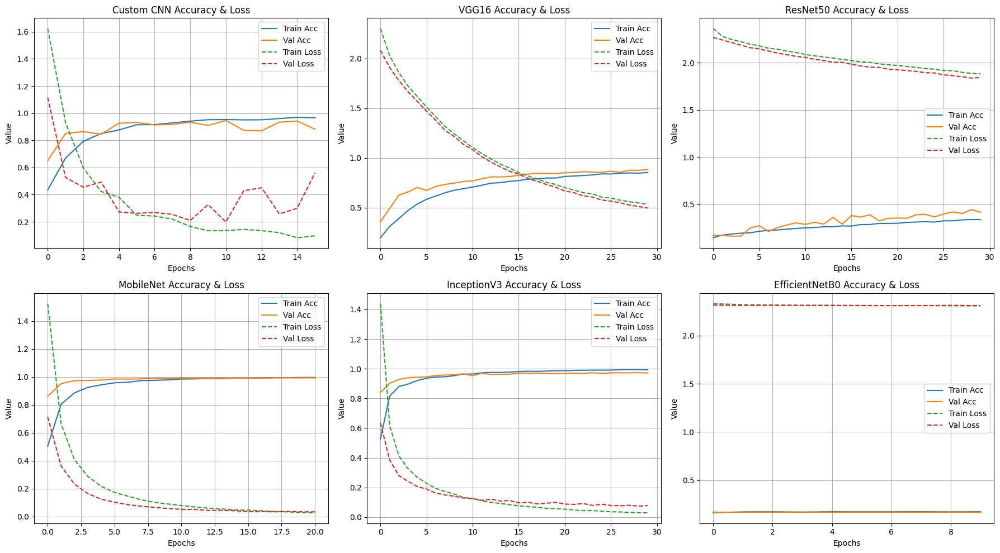

In [ ]:
all_histories = [
    cnn_history,
    vgg16_history,
    resnet50_history,
    mobilenet_history,
    inceptionv3_history,
    efficientnetb0_history
]
all_titles = [
    "Custom CNN",
    "VGG16",
    "ResNet50",
    "MobileNet",
    "InceptionV3",
    "EfficientNetB0"
]
plot_model_histories(all_histories, all_titles)

## **4. Model Evaluation**

In [ ]:
def evaluate_model(model, test_ds, class_names, model_name):
    y_true = []
    y_pred = []

    for images, labels in test_ds:
        preds = model.predict(images)
        y_pred.extend(np.argmax(preds, axis=1))
        y_true.extend(np.argmax(labels.numpy(), axis=1))

    # Metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    rec = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print(f"\n {model_name} Metrics:")
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
    plt.title(f'{model_name} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    return {
        'Model': model_name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-Score': f1
    }
class_names = ['fish sea_food shrimp',
               'fish sea_food trout',
               'fish sea_food red_sea_bream',
               'animal fish',
               'fish sea_food gilt_head_bream',
               'fish sea_food hourse_mackerel',
               'fish sea_food red_mullet',
               'fish sea_food striped_red_mullet',
               'fish sea_food black_sea_sprat',
               'fish sea_food sea_bass',
               'animal fish bass']
results = []

### Evaluation Each Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━

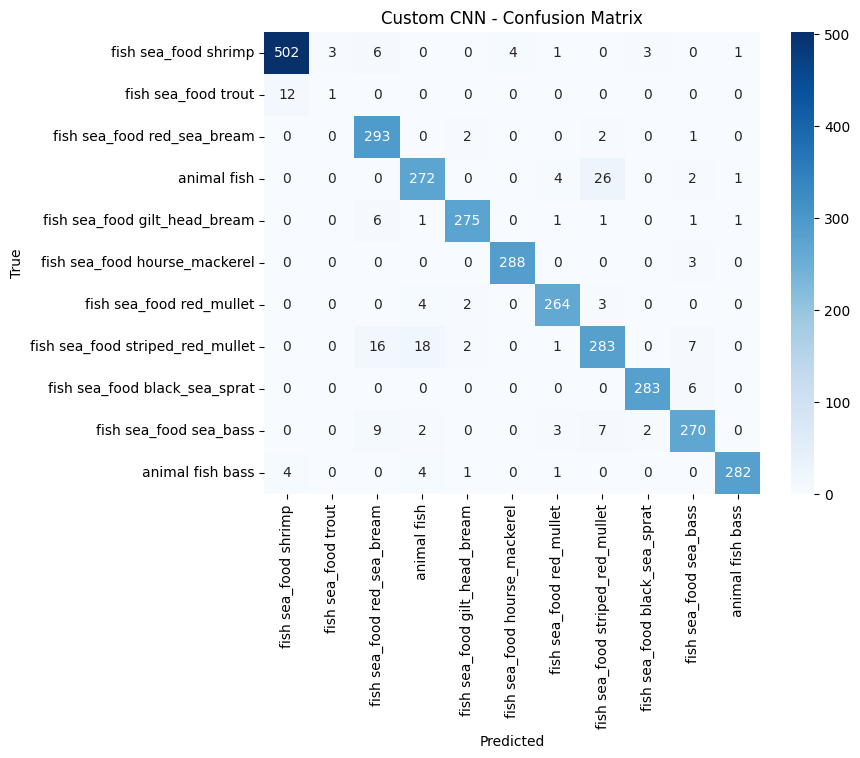

In [ ]:
results.append(evaluate_model(CNN_model, test_ds, class_names, 'Custom CNN'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


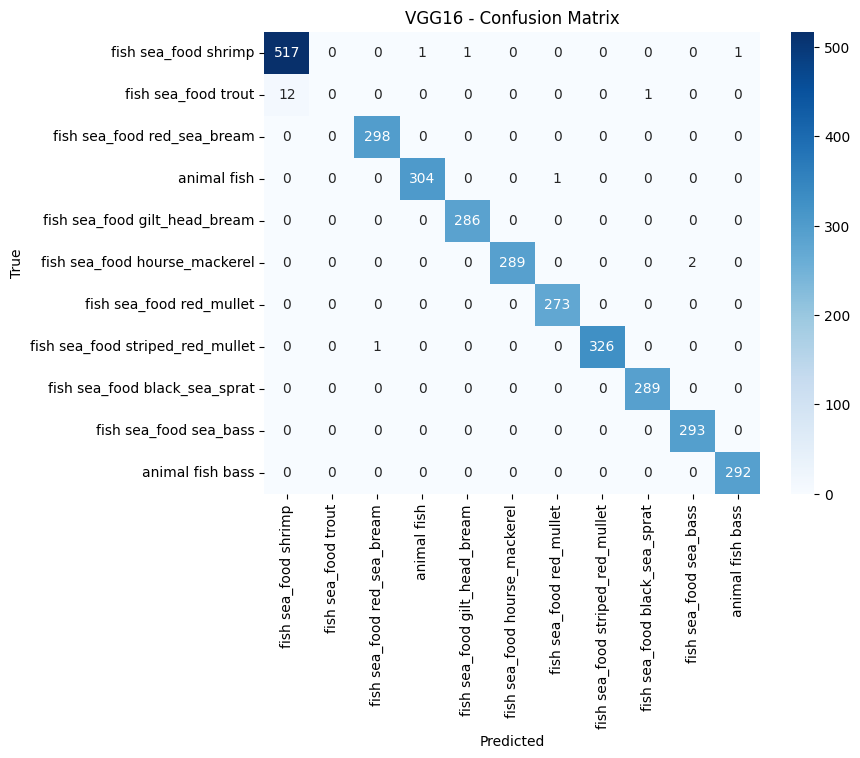

In [ ]:
results.append(evaluate_model(vgg16_model, test_ds, class_names, 'VGG16'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━

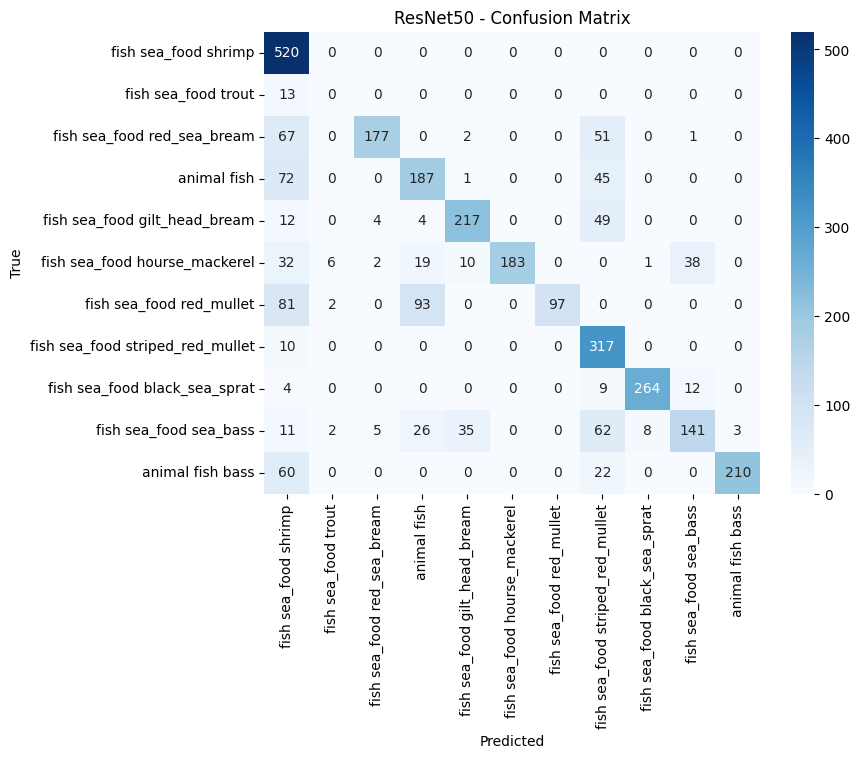

In [ ]:
results.append(evaluate_model(resnet50_model, test_ds, class_names, 'ResNet50'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━

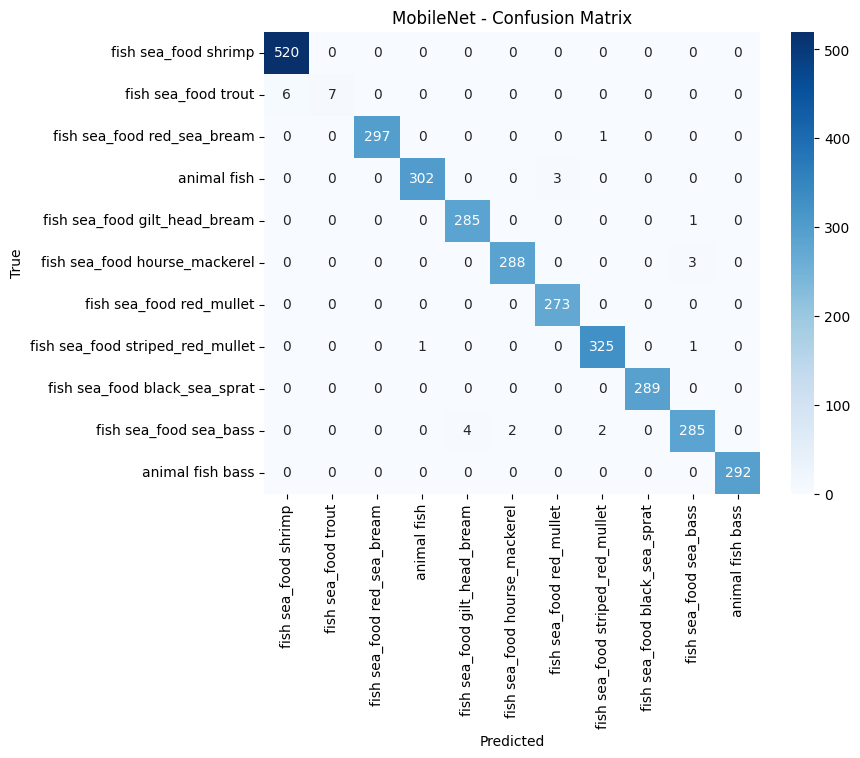

In [ ]:
results.append(evaluate_model(mobilenet_model, test_ds, class_names, 'MobileNet'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━

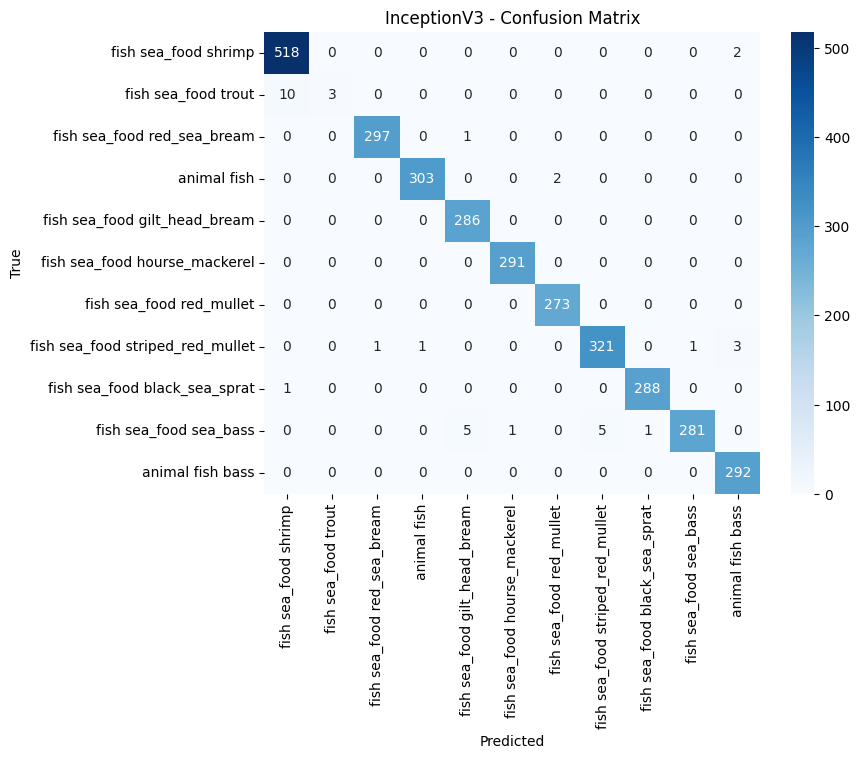

In [ ]:
results.append(evaluate_model(inceptionv3_model, test_ds, class_names, 'InceptionV3'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


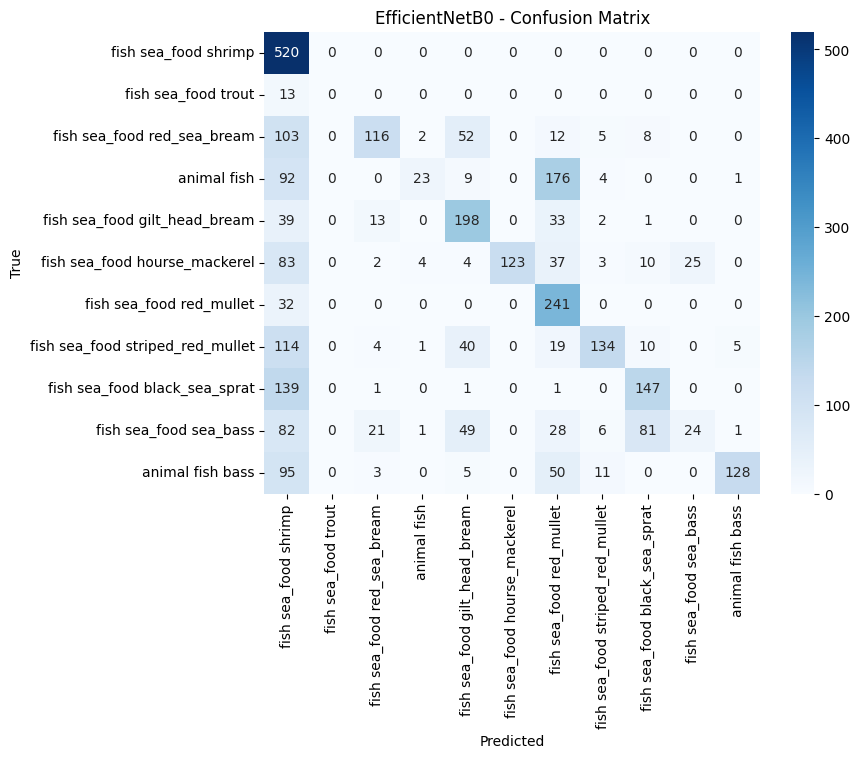

In [ ]:
results.append(evaluate_model(efficientnetb0_model, test_ds, class_names, 'EfficientNetB0'))

### Comparing All the Models

In [ ]:
summary_df = pd.DataFrame(results)
summary_df

,Model,Accuracy,Precision,Recall,F1-Score
0,Custom CNN,0.945403,0.943985,0.945403,0.944249
1,VGG16,0.993725,0.989719,0.993725,0.991706
2,ResNet50,0.725761,0.793222,0.725761,0.720304
3,MobileNet,0.992469,0.992497,0.992469,0.992186
4,InceptionV3,0.989332,0.989443,0.989332,0.988344
5,EfficientNetB0,0.518983,0.646081,0.518983,0.482539


## **5. Saving the Best Model**

In [ ]:
mobilenet_model.save("best_mobilenet_model.h5")